In [1]:
# from sympy import ntt, intt
from sympy.utilities.iterables import ibin, iterable
from sympy.utilities.misc import as_int
from sympy.ntheory import isprime, primitive_root

def number_theoretic_transform(seq, prime, inverse=False, log=True):
    """Utility function for the Number Theoretic Transform"""

    if not iterable(seq):
        raise TypeError("Expected a sequence of integer coefficients "
                        "for Number Theoretic Transform")

    p = as_int(prime)
    if not isprime(p):
        raise ValueError("Expected prime modulus for "
                        "Number Theoretic Transform")

    a = [as_int(x) % p for x in seq]

    n = len(a)
    if n < 1:
        return a

    b = n.bit_length() - 1
    if n&(n - 1):
        b += 1
        n = 2**b

    if (p - 1) % n:
        raise ValueError("Expected prime modulus of the form (m*2**k + 1)")

    a += [0]*(n - len(a))
    for i in range(1, n):
        j = int(ibin(i, b, str=True)[::-1], 2)
        #print("j: ", j)
        if i < j:
            a[i], a[j] = a[j], a[i]
    
    pr = primitive_root(p)
    
    rt = pow(pr, (p - 1) // n, p)
    
    if inverse:
        rt = pow(rt, p - 2, p)

    w = [1]*(n // 2)
    for i in range(1, n // 2):
        w[i] = w[i - 1]*rt % p
    if log:
        print("RT", rt)
        print("Primitive_root:", pr)
        print('After switch a:', a)
        print("W: ",w)
    h = 2
    while h <= n:
        hf, ut = h // 2, n // h
        for i in range(0, n, h):
            for j in range(hf):
                if log:print("a in iteration", a)
                u, v = a[i + j], a[i + j + hf]*w[ut * j]
                
                a[i + j], a[i + j + hf] = (u + v) % p, (u - v) % p
                if log:print("Operating a{} = (a{} + a{}w{})mod p = {}".format((i+j),(i+j),(i+j+hf),(ut*j),a[i+j]))
                if log:print("Operating a{} = (a{} - a{}w{})mod p = {}".format((i+j+hf),(i+j),(i+j+hf),(ut*j),a[i+j+hf]))
                
        h *= 2
    
    if inverse:
        rv = pow(n, p - 2, p)
        a = [x*rv % p for x in a]

    return a



In [2]:

# sequence
seq = [15, 21, 13, 44, 17]

prime_no = 257

print("P:", prime_no)
print("Original Sequence: ",seq)
# ntt
ntt_seq = number_theoretic_transform(seq, prime_no)
print("NTT : ", ntt_seq)

inv_ntt_seq = number_theoretic_transform(ntt_seq, prime_no, inverse=True)
#intt_seq = intt(ntt_seq, prime_no)
print("INTT : ", inv_ntt_seq)


P: 257
Original Sequence:  [15, 21, 13, 44, 17]
RT 64
Primitive_root: 3
After switch a: [15, 17, 13, 0, 21, 0, 44, 0]
W:  [1, 64, 241, 4]
a in iteration [15, 17, 13, 0, 21, 0, 44, 0]
Operating a0 = (a0 + a1w0)mod p = 32
Operating a1 = (a0 - a1w0)mod p = 255
a in iteration [32, 255, 13, 0, 21, 0, 44, 0]
Operating a2 = (a2 + a3w0)mod p = 13
Operating a3 = (a2 - a3w0)mod p = 13
a in iteration [32, 255, 13, 13, 21, 0, 44, 0]
Operating a4 = (a4 + a5w0)mod p = 21
Operating a5 = (a4 - a5w0)mod p = 21
a in iteration [32, 255, 13, 13, 21, 21, 44, 0]
Operating a6 = (a6 + a7w0)mod p = 44
Operating a7 = (a6 - a7w0)mod p = 44
a in iteration [32, 255, 13, 13, 21, 21, 44, 44]
Operating a0 = (a0 + a2w0)mod p = 45
Operating a2 = (a0 - a2w0)mod p = 19
a in iteration [45, 255, 19, 13, 21, 21, 44, 44]
Operating a1 = (a1 + a3w2)mod p = 47
Operating a3 = (a1 - a3w2)mod p = 206
a in iteration [45, 47, 19, 206, 21, 21, 44, 44]
Operating a4 = (a4 + a6w0)mod p = 65
Operating a6 = (a4 - a6w0)mod p = 234
a in ite

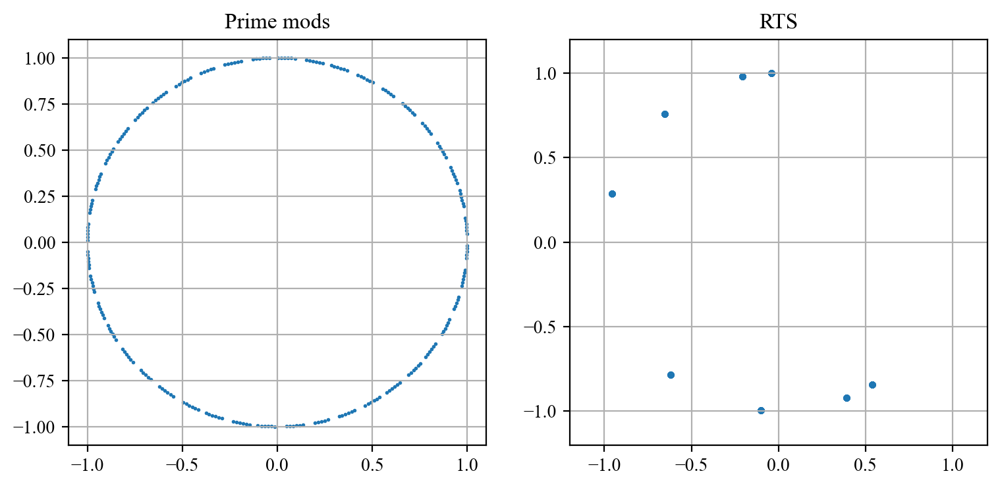

In [3]:
import matplotlib.pyplot as plt
import numpy as np
plt.rc('font',family='Times New Roman')

fig, ax = plt.subplots(1,2,dpi=200,figsize = (9,4))
prime_root = 3
prime_mods = np.array([prime_root**i%prime_no for i in range(1, prime_no)])
n = 8
rt = prime_root ** ((prime_no - 1) // n) % prime_no
rts = np.array([rt**i%prime_no for i in range(1, prime_no)])
sorted(prime_mods)
ax[0].scatter(x = np.cos(prime_mods), y = - np.sin(prime_mods), s = 1)
ax[0].grid()
ax[0].set_title('Prime mods')
ax[1].set_title('RTS')
ax[1].scatter(x = np.cos(rts), y = - np.sin(rts), s = 7)
ax[1].set_xlim([-1.2,1.2])
ax[1].set_ylim([-1.2,1.2])
ax[1].grid()


In [4]:
import random

class RandomFlipper:
    def __init__(self, rand_prob = 0.1):
        self.flips = 0
        self.prob = rand_prob
    def flip_random_bit(self, n):
        binary = bin(n)[2:]
        index = random.randint(0, len(binary) - 1)
        flipped = binary[:index] + ('0' if binary[index] == '1' else '1') + binary[index + 1:]
        #print("{} --> {}".format(binary, flipped))

        self.flips += 1
        return int(flipped, 2)

    def randomize(self, n):
        if random.random() < self.prob:
            #print("---Error Flip Occurs---")
            return self.flip_random_bit(n)
        else:
            return n


In [5]:
def randomized_ntt(seq, prime, inverse=False, rand_prob = 0.1, log = True):
    flipper = RandomFlipper(rand_prob = rand_prob)
    """Utility function for the Number Theoretic Transform"""

    if not iterable(seq):
        raise TypeError("Expected a sequence of integer coefficients "
                        "for Number Theoretic Transform")

    p = as_int(prime)
    if not isprime(p):
        raise ValueError("Expected prime modulus for "
                        "Number Theoretic Transform")

    a = [as_int(x) % p for x in seq]

    n = len(a)
    if n < 1:
        return a

    b = n.bit_length() - 1
    if n&(n - 1):
        b += 1
        n = 2**b

    if (p - 1) % n:
        raise ValueError("Expected prime modulus of the form (m*2**k + 1)")

    a += [0]*(n - len(a))
    for i in range(1, n):
        j = int(ibin(i, b, str=True)[::-1], 2)
        if i < j:
            a[i], a[j] = a[j], a[i]
    pr = primitive_root(p)
    rt = pow(pr, (p - 1) // n, p)
    if inverse:
        rt = pow(rt, p - 2, p)

    w = [1]*(n // 2)
    for i in range(1, n // 2):
        w[i] = w[i - 1]*rt % p
    if log:
        print("PM: ", pr)
        print("RT: ", rt)
        print("W: ", w)
    h = 2
    while h <= n:
        hf, ut = h // 2, n // h
        for i in range(0, n, h):
            for j in range(hf):
                if log: print("a in iteration", a)
                u, v = a[i + j], a[i + j + hf]*w[ut * j]
                
                a[i + j] = (u + v) % p
                if log: print("Operating a{} = (a{} + a{}w{})mod p = {}".format((i+j),(i+j),(i+j+hf),(ut*j),a[i+j]))
                a[i + j] = flipper.randomize(a[i + j])
                a[i + j + hf] = (u - v) % p
                if log: print("Operating a{} = (a{} - a{}w{})mod p = {}".format((i+j+hf),(i+j),(i+j+hf),(ut*j),a[i+j+hf]))
                a[i + j + hf] = flipper.randomize(a[i + j + hf])
                
        h *= 2
    
    if inverse:
        rv = pow(n, p - 2, p)
        a = [x*rv % p for x in a]
    if log:
        print("--------------------------------------------------------------------------------")
        print("Flip occurs {} times".format(flipper.flips))
        print("--------------------------------------------------------------------------------")
    return a


In [6]:
# sequence
seq = [15, 21, 13, 44, 17]

prime_no = 257

print("P:", prime_no)
print("Original Sequence: ",seq)
# ntt
ntt_seq = randomized_ntt(seq, prime_no)
print("NTT : ", ntt_seq)

# inv_ntt_seq = randmoized_ntt(ntt_seq, prime_no, inverse=True)
# intt_seq = intt(ntt_seq, prime_no)
# print("INTT : ", inv_ntt_seq)

P: 257
Original Sequence:  [15, 21, 13, 44, 17]
PM:  3
RT:  64
W:  [1, 64, 241, 4]
a in iteration [15, 17, 13, 0, 21, 0, 44, 0]
Operating a0 = (a0 + a1w0)mod p = 32
Operating a1 = (a0 - a1w0)mod p = 255
a in iteration [32, 255, 13, 0, 21, 0, 44, 0]
Operating a2 = (a2 + a3w0)mod p = 13
Operating a3 = (a2 - a3w0)mod p = 13
a in iteration [32, 255, 13, 13, 21, 0, 44, 0]
Operating a4 = (a4 + a5w0)mod p = 21
Operating a5 = (a4 - a5w0)mod p = 21
a in iteration [32, 255, 13, 13, 21, 21, 44, 0]
Operating a6 = (a6 + a7w0)mod p = 44
Operating a7 = (a6 - a7w0)mod p = 44
a in iteration [32, 255, 13, 13, 21, 21, 44, 44]
Operating a0 = (a0 + a2w0)mod p = 45
Operating a2 = (a0 - a2w0)mod p = 19
a in iteration [45, 255, 19, 13, 21, 21, 44, 44]
Operating a1 = (a1 + a3w2)mod p = 47
Operating a3 = (a1 - a3w2)mod p = 206
a in iteration [45, 45, 19, 206, 21, 21, 44, 44]
Operating a4 = (a4 + a6w0)mod p = 65
Operating a6 = (a4 - a6w0)mod p = 234
a in iteration [45, 45, 19, 206, 65, 21, 234, 44]
Operating a5 

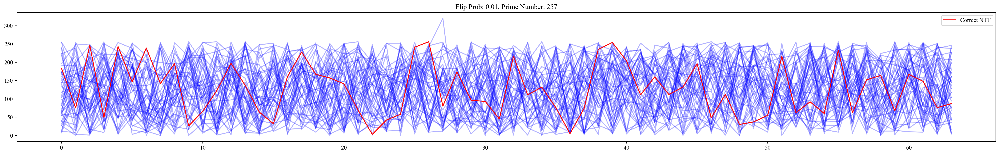

In [7]:
seq = np.random.randint(0, 1000, size = [50])
fig, ax = plt.subplots(dpi=200, figsize = [30, 4])
prob = 0.01
epochs = 50
for _ in range(epochs):
    ax.plot(randomized_ntt(seq,prime_no, log = False), alpha = 0.3, c = 'blue')
ax.plot(number_theoretic_transform(seq, prime_no, log = False), label="Correct NTT", c = 'red')

ax.set_title("Flip Prob: {}, Prime Number: {}".format(prob, prime_no))
ax.legend()

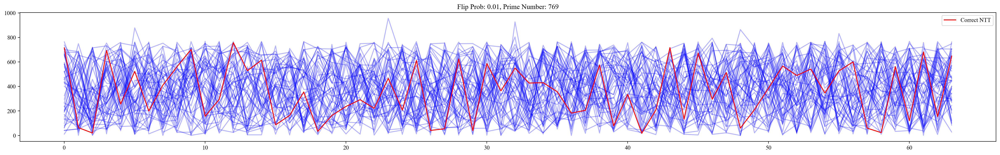

In [8]:
seq = np.random.randint(0, 1000, size = [50])
fig, ax = plt.subplots(dpi=200, figsize = [30, 4])
prob = 0.01
epochs = 50
prime_no = 3*2**8 + 1
for _ in range(epochs):
    ax.plot(randomized_ntt(seq,prime_no, log = False), alpha = 0.3, c = 'blue')
ax.plot(number_theoretic_transform(seq, prime_no, log = False), label="Correct NTT", c = 'red')

ax.set_title("Flip Prob: {}, Prime Number: {}".format(prob, prime_no))
ax.legend()

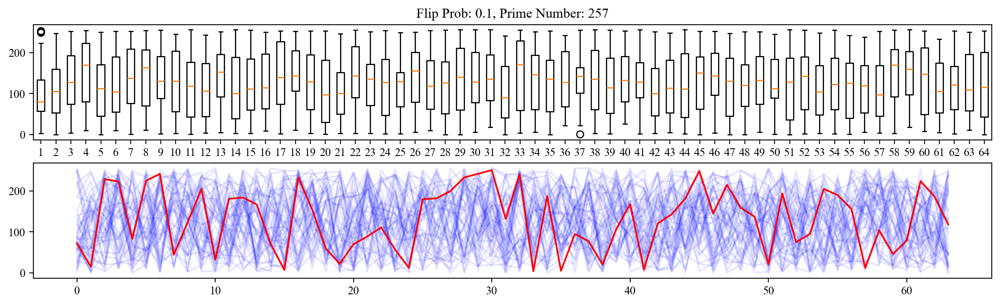

In [9]:
import numpy as np
import matplotlib.pyplot as plt

seq = np.random.randint(0, 1000, size=[50])
prob = 0.1
epochs = 50
prime_no = 2**8 + 1

# Create a list to store the data for the box plot
samples = []

for _ in range(epochs):
    samples.append(randomized_ntt(seq, prime_no, log=False))

# Create a box plot instead of a line plot
fig, ax = plt.subplots(2,dpi=200, figsize=[15, 4])
samples = np.array(samples).T
ax[0].boxplot(samples.T)
ax[1].plot(samples, alpha = 0.1, c = 'blue')
ax[1].plot(number_theoretic_transform(seq, prime_no, log = False), label="Correct NTT", c = 'red')

ax[0].set_title("Flip Prob: {}, Prime Number: {}".format(prob, prime_no))
plt.show()


In [10]:
samples.shape

(64, 50)

In [11]:
len(samples[0])

50

### Correctness Check

In [12]:
for i in range(60):
    if isprime(3*2**i+1):
        print(i)

1
2
5
6
8
12
18
30
36
41


In [13]:
def ntt(x, pm, log=True): return number_theoretic_transform(x, pm, log=log)
def intt(x, pm, log=True): return number_theoretic_transform(x, pm, log=log, inverse=True)
pm = 3*2**41+1
print('PM:',pm)
seq_a = [0,479,2736,3593,1]
seq_b = [7,50,132,35554,0]
ntt_a = ntt(seq_a, pm, log=False)
ntt_b = ntt(seq_b, pm, log=False)
ntt_ab = [ntt_a[i] * ntt_b[i] for i in range(len(ntt_a))]
ntt_a, ntt_b, ntt_ab

PM: 6597069766657


([6809,
  646455362748,
  386777923209,
  4046323344506,
  6597069765322,
  5080291639050,
  6210291837978,
  3421069187006],
 [35743,
  4074374740751,
  1808272899445,
  5644075318987,
  6597069731192,
  252747997648,
  4788796866962,
  3222941475956],
 [243374087,
  2633901401003476162943748,
  699400036642453988719005,
  22837753721367246643935422,
  43521329263367677063323824,
  1284033539237763464954400,
  29739826096628726925082836,
  11025905774916710616627736])

In [14]:
intt(ntt_ab, pm, log=False)

[0, 3353, 43102, 225179, 17571175, 97750070, 127745654, 35554]

In [15]:
import  numpy.polynomial.polynomial as poly
true_res = poly.polymul(seq_a,seq_b)
true_res

array([0.00000000e+00, 3.35300000e+03, 4.31020000e+04, 2.25179000e+05,
       1.75711750e+07, 9.77500700e+07, 1.27745654e+08, 3.55540000e+04])

In [16]:
def ntt_poly_mul(seq_a, seq_b, pm = 65537, flip_prob = 0):
    ntt_a = randomized_ntt(seq_a, pm, log=False, rand_prob=flip_prob)
    ntt_b = randomized_ntt(seq_b, pm, log=False, rand_prob=flip_prob)
    return randomized_ntt([ntt_a[i] * ntt_b[i] for i in range(len(ntt_a))], pm, log=False, inverse = True, rand_prob = flip_prob)

In [17]:
ntt_poly_mul(seq_a,seq_b)

[0, 3353, 43102, 28568, 7259, 34403, 14041, 35554]

### Multi-layer Test

In [114]:
def multi_ntt_rand_seq(seqs, pm = 3 * 2**41 + 1, flip_prob = 0):
    #assert np.max(seqs) < pm
    #seqs = np.random.randint(scale, size = [layers_count+1, seq_len])
    #print("Datashape", seqs.shape)
    temp = seqs[0]
    for i in range(1,len(seqs)):
        temp = ntt_poly_mul(temp, seqs[i], pm=pm, flip_prob=flip_prob)
        #print('Mult ', i+1)
    return temp


In [19]:
def test_multi_layers(layers, pm, scale, flip_prob, draw = True):
    polynominals = np.random.randint(200, size = [5, 50])
    epochs = 50
    samples = []
    
    for _ in range(epochs):
        res = multi_ntt_rand_seq(polynominals, pm, flip_prob= flip_prob)
        samples.append(res)
    samples = np.array(samples)
    correct = multi_ntt_rand_seq(polynominals,  pm, flip_prob = 0)
    if draw:
        fig, ax = plt.subplots(2,dpi=200, figsize=(15,6))
        ax[0].plot(samples.T, alpha=0.3, c='blue')
        ax[0].plot(correct, c='Red')
        ax[1].boxplot(samples)
        ax[0].set_title('Layers:{} PM:{} Scale:{} Flip_prob:{}'.format(layers, pm, scale, flip_prob))
        plt.tight_layout()
        plt.show()
    return samples, np.array(correct)

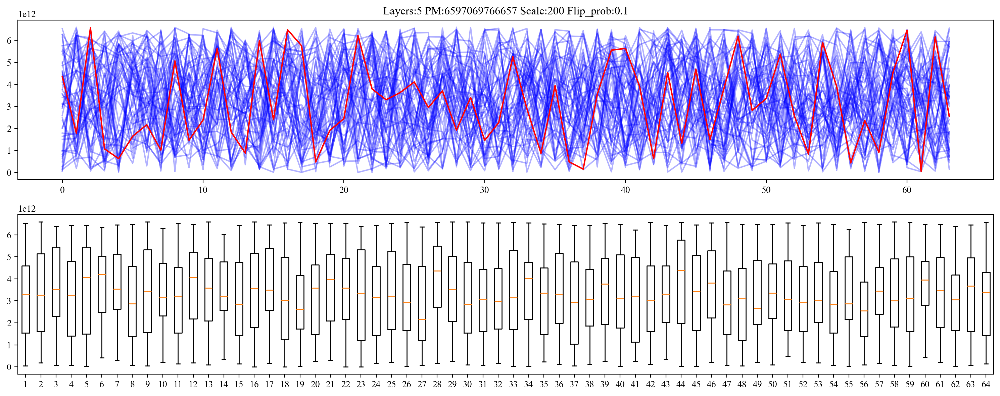

(array([[1504958877946, 1542046460636, 4996638829845, ..., 3240620096888,
         3256635957587, 5709263480623],
        [4849349301083, 5199378278189, 3772315401409, ..., 1703479044029,
         5523919901162, 3650769923988],
        [ 479284456124, 6219806086848, 6031879892635, ..., 1082955509538,
         2472741341197,  699796351115],
        ...,
        [2978383422802, 4638474096465, 4332956664577, ..., 1603135881879,
         3937225732623, 3784704458032],
        [5347345620247, 6211603621565, 6119839410457, ..., 4565345827391,
         6271504606097, 2551615813987],
        [4598255568312, 1588947321169, 2854674078483, ..., 3082773664300,
          893308855519, 1016361528010]]),
 array([4357658452892, 1780627927506, 6572246665616, 1071458769310,
         626726495100, 1645517314239, 2166090387546, 1013602988969,
        5066037029619, 1464632121627, 2382313099794, 5644711194664,
        1829006974389,  878555901390, 5989561039455, 2392683694448,
        6483799958402, 575442

In [20]:
test_multi_layers(5, 3 * 2**41 + 1, 200, 0.1)

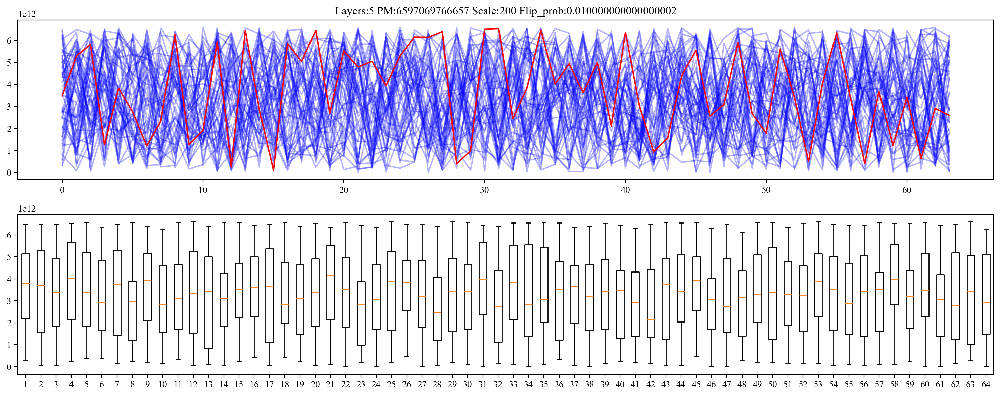

(array([[ 336399192142, 1935575827283, 1893008300270, ..., 1003385484298,
         2328141566615, 5093646729673],
        [1970265828810, 4188872983767, 1260845085553, ...,  600170930269,
         6028380894697, 5245325592686],
        [2692620357460, 3820843543156,  451495023646, ..., 6394621382722,
         4745512273577, 4590022363256],
        ...,
        [ 800788580490,   71349603696, 1458119273822, ..., 2007015426121,
         1370849256930, 3649168324895],
        [2501645752723, 2139222546464, 4739545708392, ..., 2178284012446,
         5131424242504,  961467131818],
        [5437126407274, 6379291151259, 1578326370407, ..., 6472446172584,
         2709073636569, 2335027577524]]),
 array([3483599167786, 5287844124626, 5815158108298, 1254872035593,
        3826165223861, 2735243358464, 1203934510125, 2327104691247,
        6257704458691, 1275896807879, 1924589050030, 5930911231108,
         242703488810, 6463924400071, 2853519164927,   87288332142,
        5857362586908, 503165

In [21]:
test_multi_layers(5, 3 * 2**41 + 1, 200, 0.1**2)

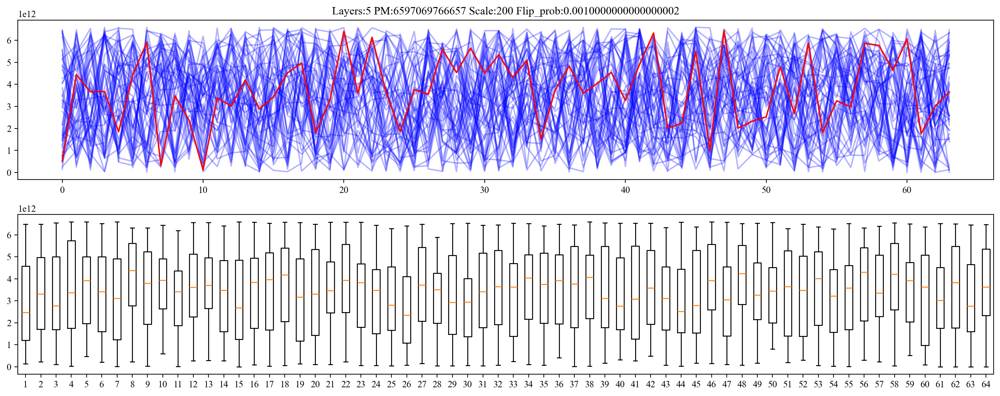

(array([[1113108085697, 1636753221256, 1419185466338, ..., 3791907425499,
         5502281416935, 6067069005198],
        [ 252659473407,  984792853979, 2081294126425, ..., 1959178469816,
         5592553096260, 2543048377730],
        [1429090054963, 3665610585123, 5158149316879, ..., 1664069590090,
          843735257154, 1575696230067],
        ...,
        [4888598579585, 1586465213098, 3871972410300, ..., 1027619582676,
         4959724132549, 1399559712162],
        [ 668893460859, 1935362828172, 5806323750034, ..., 4005599012953,
            1708772336,  124330696981],
        [2960919141694, 2213468938491, 6387679077007, ..., 6180432285828,
         2419458526308, 5722339619794]]),
 array([ 519898795906, 4443109169112, 3662243636054, 3674332394131,
        1845570988101, 4424616258262, 5907391954897,  328713919796,
        3481142021272, 2376910892942,  111327323916, 3383733106759,
        3015753761150, 4209092659415, 2877253059686, 3435335714705,
        4527469564185, 496933

In [22]:
test_multi_layers(5, 3 * 2**41 + 1, 200, 0.1**3)

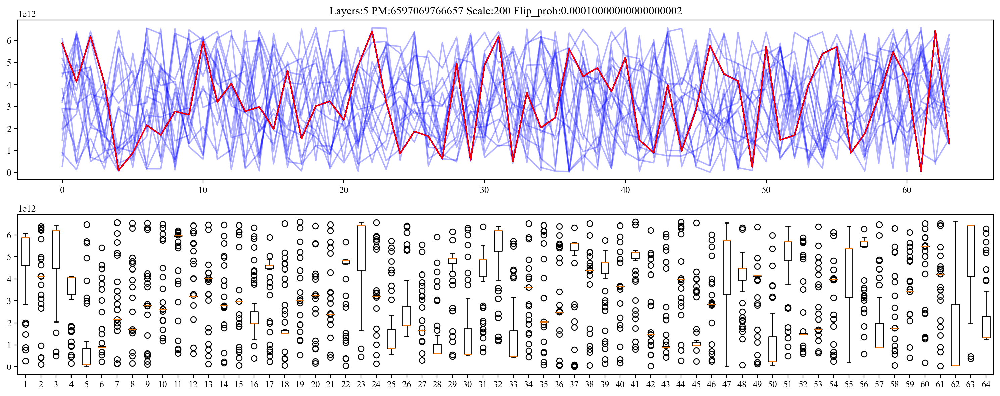

(array([[2898868760375, 2862071504938, 4831509811207, ..., 5493290873755,
         2434724389241, 3955181562621],
        [3802261500567,  416435240631, 1551601551414, ..., 5431722455484,
         6256501635096, 3928099194312],
        [6068506315131, 3278528202213,  690319419011, ..., 2597312786530,
         3291079174763, 6067995687492],
        ...,
        [3282218966649, 4905849367949, 4189512297343, ..., 5602292475495,
         3139807564394, 2741555775108],
        [5873572655413, 4127903823407, 6193288206646, ...,   55090127489,
         6451609452448, 1327011002043],
        [2830973904131,  958838382005, 3176305105825, ..., 3224155568891,
         2871522786612, 1270094553528]]),
 array([5873572655413, 4127903823407, 6193288206646, 4062451008600,
          99886379632,  883041008359, 2157849810039, 1704522740031,
        2772044778861, 2616184466971, 5965102810933, 3198206575902,
        4043336695958, 2774073788320, 2978017406925, 1972278921253,
        4628472452149, 153823

In [23]:
test_multi_layers(5, 3 * 2**41 + 1, 200, 0.1**4)

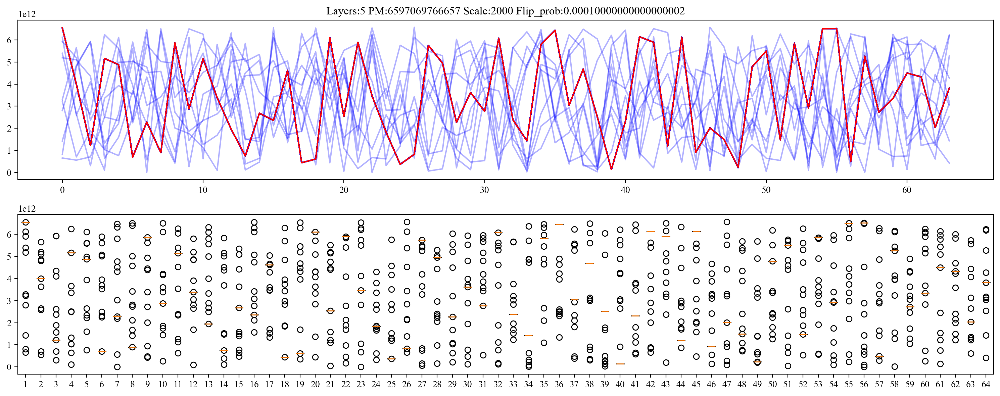

(array([[6547225983431, 3997064208354, 1216529123522, ..., 4326625887037,
         2037132857706, 3819515945262],
        [6547225983431, 3997064208354, 1216529123522, ..., 4326625887037,
         2037132857706, 3819515945262],
        [6547225983431, 3997064208354, 1216529123522, ..., 4326625887037,
         2037132857706, 3819515945262],
        ...,
        [6547225983431, 3997064208354, 1216529123522, ..., 4326625887037,
         2037132857706, 3819515945262],
        [6547225983431, 3997064208354, 1216529123522, ..., 4326625887037,
         2037132857706, 3819515945262],
        [6547225983431, 3997064208354, 1216529123522, ..., 4326625887037,
         2037132857706, 3819515945262]]),
 array([6547225983431, 3997064208354, 1216529123522, 5162160991315,
        4880026789847,  695829793044, 2282571458523,  897162898870,
        5869710568392, 2871974704768, 5146498944916, 3387725525194,
        1951086926895,  749443252311, 2683277831455, 2356589972898,
        4623658377803,  44275

In [24]:
test_multi_layers(5, 3 * 2**41 + 1, 2000, 0.1**4)

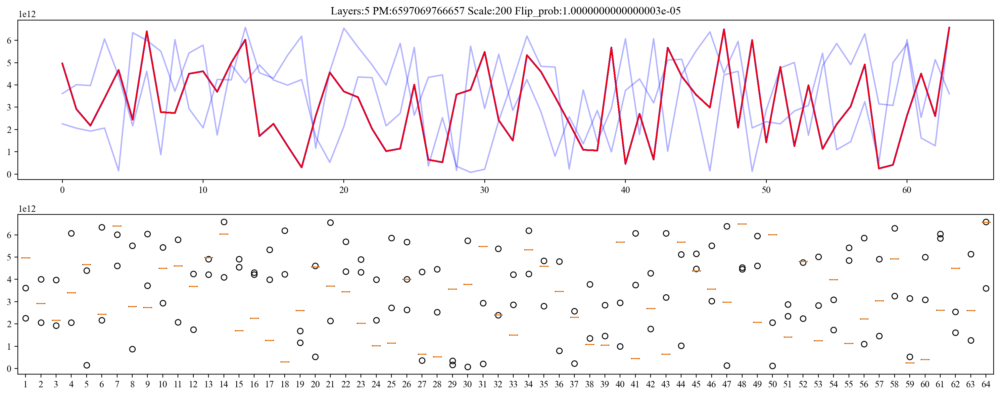

(array([[4965020773269, 2914009770313, 2173477353486, ..., 4507679907667,
         2599610767483, 6571097700540],
        [4965020773269, 2914009770313, 2173477353486, ..., 4507679907667,
         2599610767483, 6571097700540],
        [2254951119148, 2059266486316, 1926970738352, ..., 1617448132704,
         1268073214815, 6588719272756],
        ...,
        [4965020773269, 2914009770313, 2173477353486, ..., 4507679907667,
         2599610767483, 6571097700540],
        [4965020773269, 2914009770313, 2173477353486, ..., 4507679907667,
         2599610767483, 6571097700540],
        [4965020773269, 2914009770313, 2173477353486, ..., 4507679907667,
         2599610767483, 6571097700540]]),
 array([4965020773269, 2914009770313, 2173477353486, 3401831251894,
        4670539435913, 2436405612316, 6406518893577, 2779165486243,
        2738808909547, 4501504123647, 4613923588980, 3692064170599,
        4991684411143, 6034191332063, 1703966139214, 2254817269365,
        1263307895281,  29435

In [25]:
test_multi_layers(5, 3 * 2**41 + 1, 200, 0.1**5)

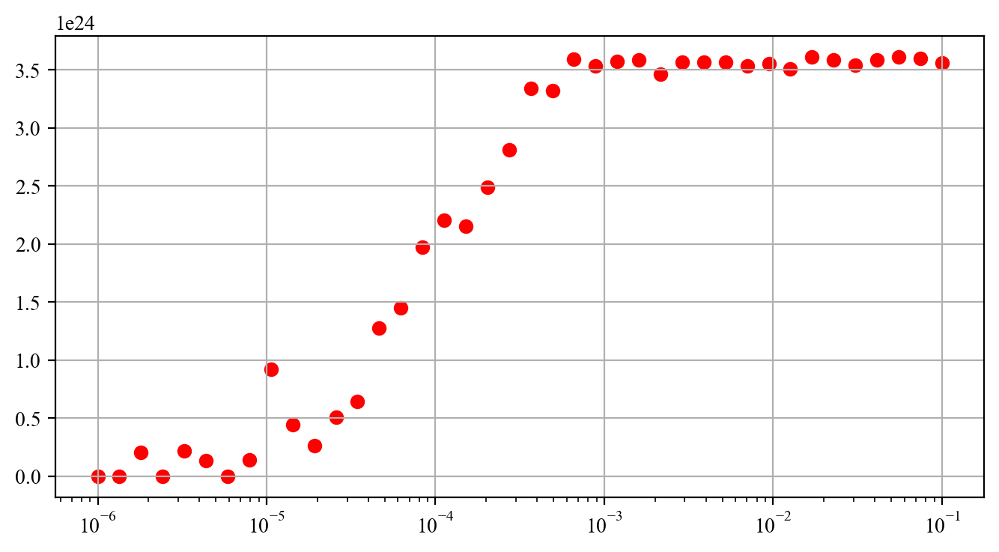

In [26]:
layers = [2,3,4,5]
pm = 3 * 2**41 + 1
scale = [10, 100, 1000, 2000]
flip_prob = np.logspace(-6, -1, 40)

variances = []
fig, ax = plt.subplots(dpi=200, figsize=(8,4))
ax.grid()
ax.set_xscale('log')
for i in range(len(flip_prob)):
    sample,_ = test_multi_layers(4, pm, 1000, flip_prob[i], draw=False)
    sample_var = np.var(sample, axis=0)
    ax.scatter(x = flip_prob[i], y = np.mean(sample_var), c = 'Red')

In [27]:
np.logspace(-6, -1, 20), np.arange(10,1000,20)

(array([1.00000000e-06, 1.83298071e-06, 3.35981829e-06, 6.15848211e-06,
        1.12883789e-05, 2.06913808e-05, 3.79269019e-05, 6.95192796e-05,
        1.27427499e-04, 2.33572147e-04, 4.28133240e-04, 7.84759970e-04,
        1.43844989e-03, 2.63665090e-03, 4.83293024e-03, 8.85866790e-03,
        1.62377674e-02, 2.97635144e-02, 5.45559478e-02, 1.00000000e-01]),
 array([ 10,  30,  50,  70,  90, 110, 130, 150, 170, 190, 210, 230, 250,
        270, 290, 310, 330, 350, 370, 390, 410, 430, 450, 470, 490, 510,
        530, 550, 570, 590, 610, 630, 650, 670, 690, 710, 730, 750, 770,
        790, 810, 830, 850, 870, 890, 910, 930, 950, 970, 990]))

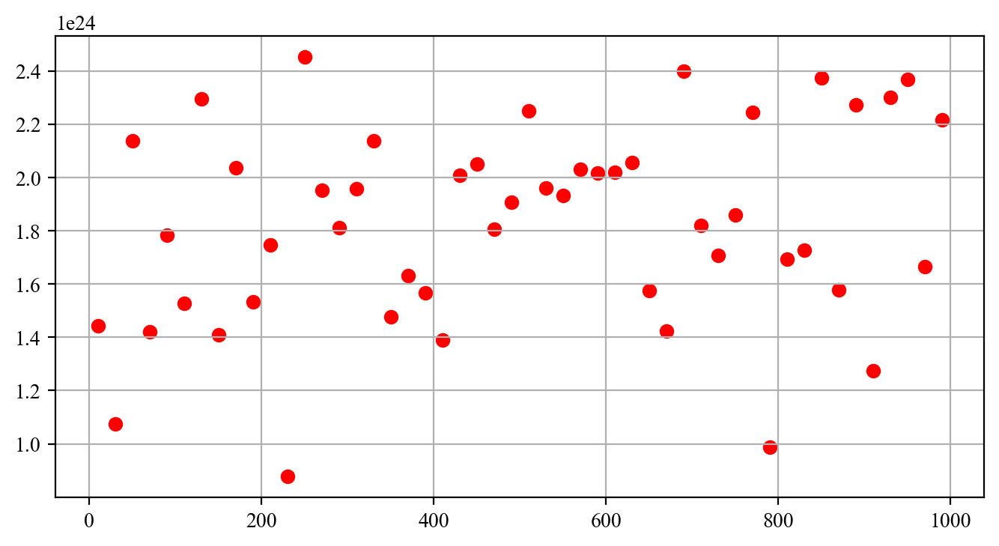

In [28]:
layers = [2,3,4,5]
pm = 3 * 2**41 + 1
scale = np.arange(10,1000,20)
flip_prob = np.logspace(-6, -1, 40)

variances = []
fig, ax = plt.subplots(dpi=200, figsize=(8,4))
ax.grid()
#ax.set_xscale('log')
for sca in scale:
    sample,_ = test_multi_layers(4, pm, sca, 0.1**4, draw=False)
    sample_var = np.var(sample, axis=0)
    ax.scatter(x = sca, y = np.mean(sample_var), c = 'Red')

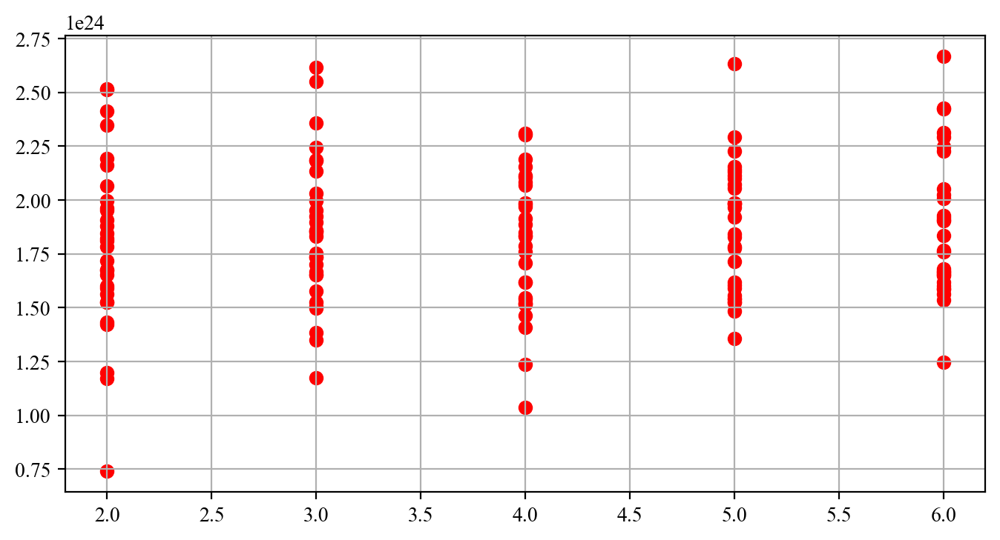

In [29]:
layers = [2,3,4,5,6]
pm = 3 * 2**41 + 1
scale = np.arange(10,1000,20)
flip_prob = np.logspace(-6, -1, 40)

variances = []
fig, ax = plt.subplots(dpi=200, figsize=(8,4))
ax.grid()
#ax.set_xscale('log')
for lay in layers:
    for _ in range(30):
        sample,_ = test_multi_layers(lay, pm, 100, 0.1**4, draw=False)
        sample_var = np.var(sample, axis=0)
        ax.scatter(x = lay, y = np.mean(sample_var), c = 'Red')

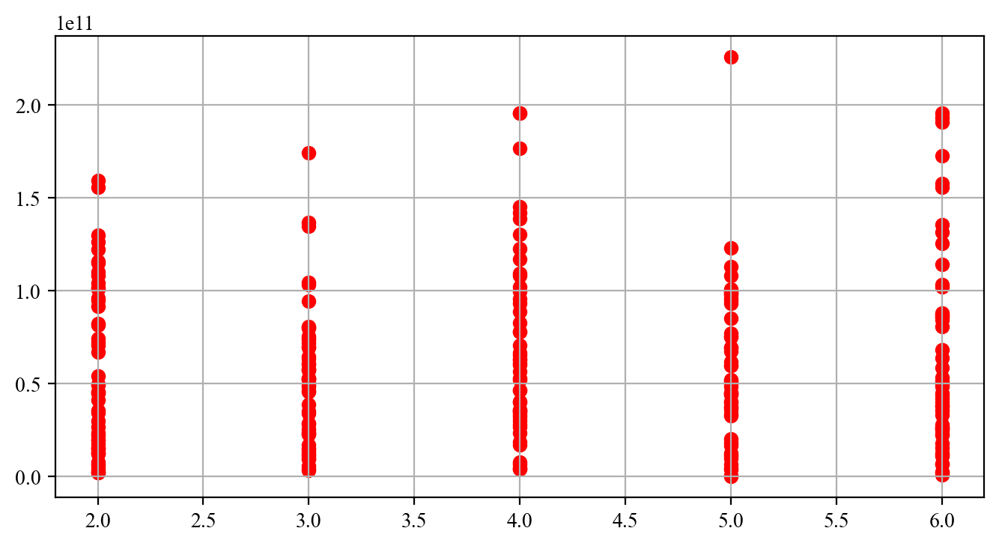

In [30]:
layers = [2,3,4,5,6]
pm = 3 * 2**41 + 1
scale = np.arange(10,1000,20)
flip_prob = np.logspace(-6, -1, 40)

variances = []
fig, ax = plt.subplots(dpi=200, figsize=(8,4))
ax.grid()
#ax.set_xscale('log')
for lay in layers:
    for _ in range(50):
        sample, correct = test_multi_layers(lay, pm, 100, 0.1**4, draw=False)
        sample_mean = np.mean(sample, axis=0)
        ax.scatter(x = lay, y = np.abs(np.mean(correct - sample_mean)), c = 'Red')

In [44]:
def hamming_distance(number1, number2):
    bin_number1 = bin(number1)[2:]
    bin_number2 = bin(number2)[2:]
    len1 = len(bin_number1)
    len2 = len(bin_number2)
    if len1 < len2:
        bin_number1 = bin_number1.zfill(len2)
    elif len1 > len2:
        bin_number2 = bin_number2.zfill(len1)
    return sum(c1 != c2 for c1, c2 in zip(bin_number1, bin_number2))

In [58]:
def hamming_distance_sum(vector1, vector2):    
    #print(vector1, vector2)
    total_distance = 0
    for num1, num2 in zip(vector1, vector2):
        bin_num1 = bin(int(num1))[2:]
        bin_num2 = bin(int(num2))[2:]
        
        len1 = len(bin_num1)
        len2 = len(bin_num2)
        
        if len1 < len2:
            bin_num1 = bin_num1.zfill(len2)
        elif len1 > len2:
            bin_num2 = bin_num2.zfill(len1)
        
        total_distance += sum(c1 != c2 for c1, c2 in zip(bin_num1, bin_num2))
    
    return total_distance

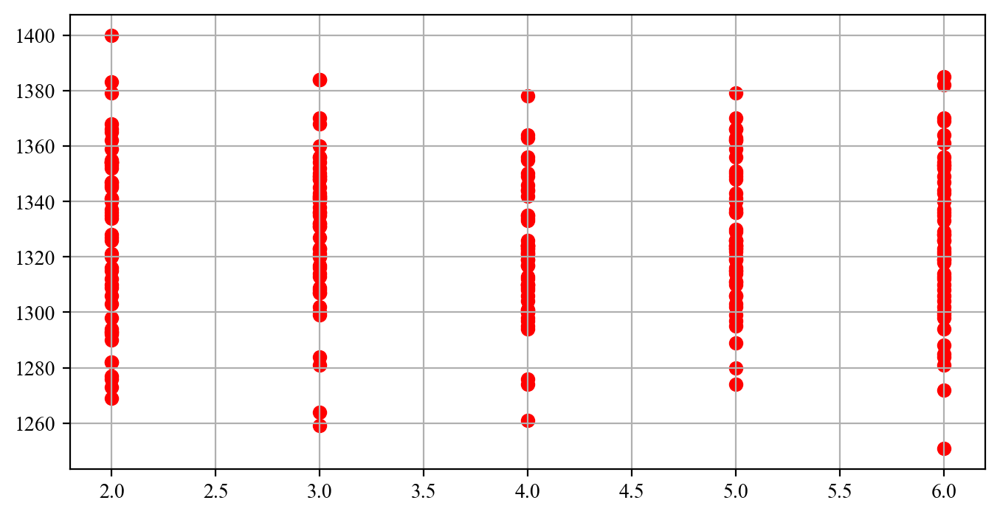

In [59]:
layers = [2,3,4,5,6]
pm = 3 * 2**41 + 1
scale = np.arange(10,1000,20)
flip_prob = np.logspace(-6, -1, 40)

variances = []
fig, ax = plt.subplots(dpi=200, figsize=(8,4))
ax.grid()
#ax.set_xscale('log')
for lay in layers:
    for _ in range(50):
        sample, correct = test_multi_layers(lay, pm, 100, 0.1**4, draw=False)
        sample_mean = np.mean(sample, axis=0)
        ax.scatter(x = lay, y = np.abs(hamming_distance_sum(correct,sample_mean)), c = 'Red')

In [60]:
def hamming_distance_vector(vector1, vector2):    
    #print(vector1, vector2)
    total_distance = []
    for num1, num2 in zip(vector1, vector2):
        bin_num1 = bin(int(num1))[2:]
        bin_num2 = bin(int(num2))[2:]
        
        len1 = len(bin_num1)
        len2 = len(bin_num2)
        
        if len1 < len2:
            bin_num1 = bin_num1.zfill(len2)
        elif len1 > len2:
            bin_num2 = bin_num2.zfill(len1)
        
        total_distance.append(sum(c1 != c2 for c1, c2 in zip(bin_num1, bin_num2)))
    
    return total_distance

In [118]:
def test_multi_layers_ham(layers, pm, scale, flip_prob, draw = True):
    #polynominals = np.random.randint(200, size = [5, 50])
    polynominals = np.array([[101, 106, 158,  74,   8,  51,   6,  94,  61, 185, 107, 195, 196,
        185,  49,  89,  36, 195, 111, 170,  34, 136, 136,  39,   8, 137,
          3, 117, 173, 155,  66,  82, 181, 142, 103,   1, 185, 181,  86,
        138,  28, 152, 138,  51,  34, 170, 103,  80,  65, 131],
       [ 48, 128,  22,  66, 175,  89,  56,  29,  31, 150, 145, 110, 101,
         31,  64,  43,  54,  36,  17,  44, 133,  99,  70,   4, 181, 106,
         93, 165, 102,  94,  28,  60, 150,  62,  57,  25,  67, 181,  49,
         23, 161, 195,  66, 177,  30, 187,  78,  41, 135, 147],
       [ 75,  14, 106, 199, 121, 169, 138, 145,  23,  66, 197,   1, 115,
         19,   7, 155,  33, 129, 144, 187, 142, 153,   7, 132,  95, 171,
         29,  21, 151, 120, 169, 114, 103,  34, 177,  65, 119,  56,  75,
          0, 196, 175, 182, 198, 104,   1,  60, 169, 191,  45],
       [ 69,  95, 106, 187,  93,  86, 138,  85,  99,  22, 158, 184, 190,
        197, 192, 142, 140, 104,  81,  58, 199, 183,  29, 184, 188,  42,
        109, 182, 179, 145, 102, 160, 109,  17,  99, 195, 154,  34, 173,
        145, 180,  17,   9,  28, 136, 141, 188,  34,  18,   4],
       [105, 161, 133, 164, 123, 185,  37, 176,   2,  95, 147, 102,  81,
         77,  13, 149, 160,  48,  99,  37,  23,  81,   7, 104, 101,  97,
        119,  36,  77, 162, 137,  68, 167, 134, 124,  96,  72, 172,  33,
         56, 196, 133, 137, 154,  36,  40, 162, 186,  46,  30]])
    epochs = 500
    samples = []
    ham_errors = []
    correct = multi_ntt_rand_seq(polynominals,  pm, flip_prob = 0)
    print(correct)
    for _ in range(epochs):
        res = multi_ntt_rand_seq(polynominals, pm, flip_prob= flip_prob)
        samples.append(res)
        ham_errors.append(hamming_distance_vector(correct, res))
    samples = np.array(samples)
    ham_errors = np.array(ham_errors)

    if draw:
        fig, ax = plt.subplots(2,dpi=200, figsize=(15,6))
        ax[0].plot(samples.T, alpha=0.3, c='blue')
        ax[0].plot(correct, c='Red')
        #ax[1].plot(np.mean(ham_errors.T,axis=1), c='blue')
        ax[1].boxplot(ham_errors)
        ax[1].plot(np.mean(ham_errors.T,axis=1), c='red')
        ax[0].set_title('Layers:{} PM:{} Scale:{} Flip_prob:{}'.format(layers, pm, scale, flip_prob))
        plt.tight_layout()
        plt.show()
    return samples, np.array(correct)

In [111]:
np.random.randint(512, size = [5, 50])

array([[124, 188,  80, 463,  20, 108, 456, 116, 101,  81, 149, 246,  45,
        328,  65, 485, 242,   2, 371, 448, 413,  39, 412,  12, 116, 297,
        186, 295, 505, 418, 266, 156, 177, 396, 259,  96,  67, 129, 316,
        116, 365, 424, 451, 441,  37, 131,  66, 405, 122,  45],
       [  5,  98, 264, 230, 158, 328, 200, 475,  90, 378, 368,  72, 446,
        278,  17, 194, 214, 316,  99,  34, 382, 146, 294, 152, 364,  71,
        265, 432,  80, 426, 486, 499,  96, 289, 188, 466, 237,  83, 261,
        390, 213, 320,  68, 290, 363, 359, 314, 112, 385, 244],
       [ 18, 118, 432,  95,  13, 148,  45, 384, 296, 133,  55, 283, 123,
        323,  29,  13, 411, 495, 351, 189, 364, 447,  76, 360, 160, 257,
        392, 460,  36, 164, 418, 257, 336,  81, 148, 226, 346, 503, 331,
        453, 463, 113,  60, 232,  21, 490, 260, 357,  33, 156],
       [346, 151,  10, 438, 170, 269, 275,  65,  70, 433,  40, 165,  60,
        201, 251, 223, 326, 184,  12,  63, 336, 136, 100, 411, 151, 399,
     

In [110]:
bin(3 * 2**41)

'0b1100000000000000000000000000000000000000000'

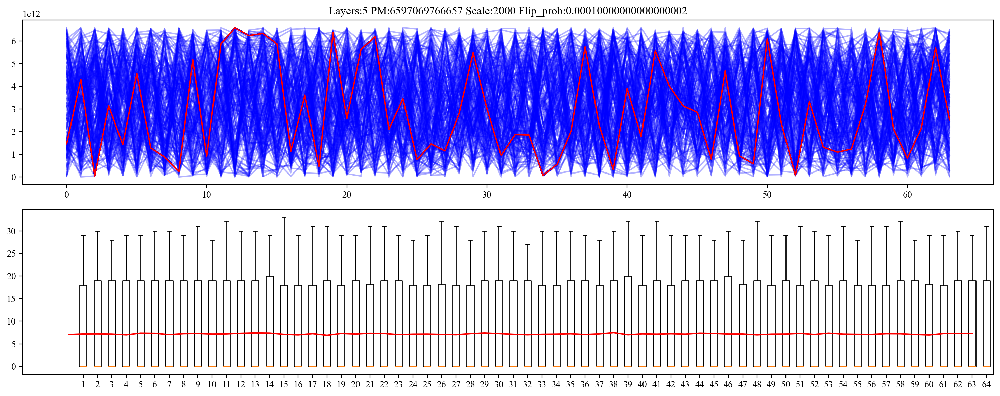

(array([[1460313445199, 4316119252697,   43902353786, ..., 2155054202735,
         5700808550384, 2514926497856],
        [1331011333480,  716293811097, 1118990827070, ..., 6308558959921,
         2847116865318, 3668303494898],
        [1460313445199, 4316119252697,   43902353786, ..., 2155054202735,
         5700808550384, 2514926497856],
        ...,
        [4563939449560, 5041087207733,  211760117447, ...,  189928372510,
         5917666077059, 2628768515143],
        [1460313445199, 4316119252697,   43902353786, ..., 2155054202735,
         5700808550384, 2514926497856],
        [1460313445199, 4316119252697,   43902353786, ..., 2155054202735,
         5700808550384, 2514926497856]]),
 array([1460313445199, 4316119252697,   43902353786, 3137445534078,
        1429451377055, 4569345413675, 1277032957551,  877869024665,
         229717126051, 5177634013038,  913492549949, 5872754776029,
        6587156805042, 6245756290758, 6335388860336, 5876352407558,
        1121105305483, 361247

In [101]:
test_multi_layers_ham(5, 3 * 2**41 + 1, 2000, 0.1**4)

[4503459472824, 2776208937611, 1757908225508, 3062208802774, 4915342998809, 5079091611859, 1500734283105, 5602552892569, 6361359848167, 6328350132830, 1087936732845, 2500685032361, 3791368305778, 1191193915277, 1352040504823, 463811355294, 5745331135857, 4242313407429, 1359881825283, 3290900850915, 1407734814642, 5210538729989, 249834905511, 6274441186647, 6117672839851, 3409092691042, 4020546427183, 4611250839983, 629384101827, 6252811539230, 1276714782381, 4333607088944, 2788467322044, 4819338448686, 2077189993770, 6008941818660, 4809700433095, 972139819646, 546772626370, 1864053921327, 5246351381992, 2581420605450, 2733934482195, 2212616978440, 112439736048, 2377823724865, 4391564112397, 6489316896871, 3763850201824, 6133638093433, 2093349500742, 1647211265381, 6550104495796, 6595457343543, 1054335011338, 4316071641717, 2978254783993, 1376578345963, 2723769942479, 4523446463872, 5898303758891, 3488134151309, 470563676234, 1341103268284]


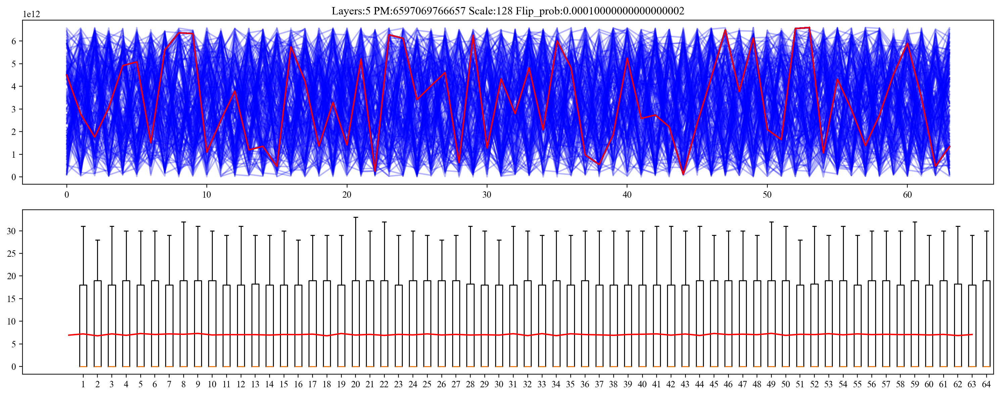

(array([[1601680774175, 4665252612703, 5625256828080, ..., 1682547944733,
         5648037562209,   92840890117],
        [5938619891234, 3845982843950, 4275516196076, ..., 3342032588299,
         2625809257385, 1115426040678],
        [4503459472824, 2776208937611, 1757908225508, ..., 3488134151309,
          470563676234, 1341103268284],
        ...,
        [4503459472824, 2776208937611, 1757908225508, ..., 3488134151309,
          470563676234, 1341103268284],
        [2373155694001, 4837793239689, 2101505609187, ..., 1632708279432,
          401844199497, 1341103268281],
        [4503459472824, 2776208937611, 1757908225508, ..., 3488134151309,
          470563676234, 1341103268284]]),
 array([4503459472824, 2776208937611, 1757908225508, 3062208802774,
        4915342998809, 5079091611859, 1500734283105, 5602552892569,
        6361359848167, 6328350132830, 1087936732845, 2500685032361,
        3791368305778, 1191193915277, 1352040504823,  463811355294,
        5745331135857, 424231

In [115]:
test_multi_layers_ham(5, 3 * 2**41 + 1, 128, 0.1**4)

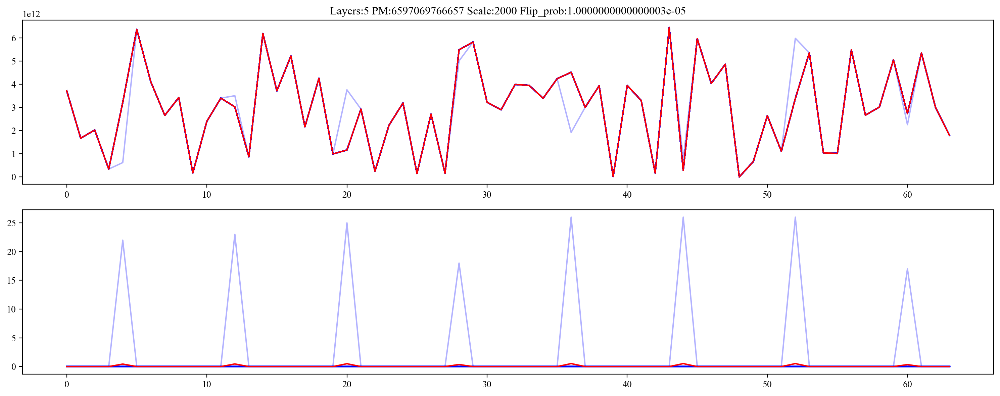

(array([[3723373759715, 1674450486799, 2026562607318, ..., 5350858036045,
         3010788576158, 1793840880162],
        [3723373759715, 1674450486799, 2026562607318, ..., 5350858036045,
         3010788576158, 1793840880162],
        [3723373759715, 1674450486799, 2026562607318, ..., 5350858036045,
         3010788576158, 1793840880162],
        ...,
        [3723373759715, 1674450486799, 2026562607318, ..., 5350858036045,
         3010788576158, 1793840880162],
        [3723373759715, 1674450486799, 2026562607318, ..., 5350858036045,
         3010788576158, 1793840880162],
        [3723373759715, 1674450486799, 2026562607318, ..., 5350858036045,
         3010788576158, 1793840880162]]),
 array([3723373759715, 1674450486799, 2026562607318,  340668115469,
        3218862396316, 6370843182136, 4110462307327, 2658866778319,
        3431002615480,  175618846785, 2400419231975, 3403427427117,
        3026252966103,  871377097885, 6192287519869, 3716420611689,
        5222340975892, 216451

In [116]:
test_multi_layers(5, 3 * 2**41 + 1, 2000, 0.1**5)

[53, 240, 110, 3, 11, 193, 178, 75, 77, 2, 110, 154, 234, 145, 192, 76, 168, 75, 70, 252, 63, 181, 179, 202, 73, 200, 151, 206, 130, 159, 120, 77, 111, 176, 171, 5, 48, 135, 1, 108, 196, 254, 28, 173, 53, 225, 83, 139, 194, 74, 68, 158, 180, 136, 193, 171, 91, 94, 122, 134, 175, 127, 11, 0]


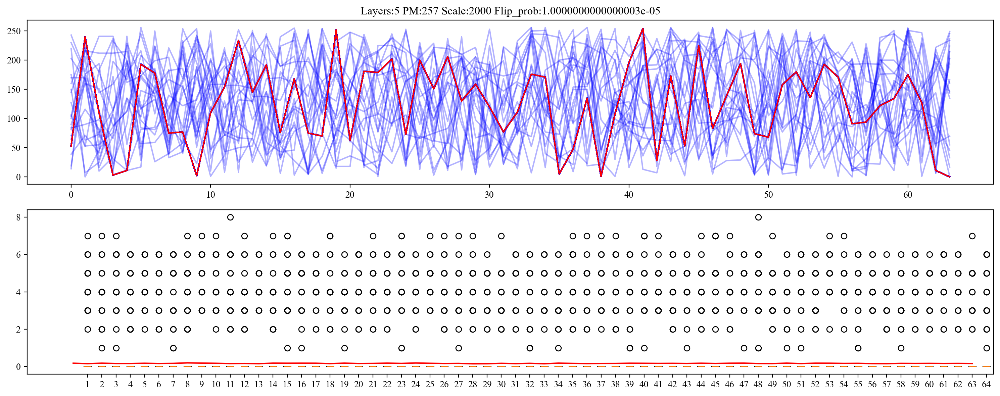

[670, 380, 724, 77, 401, 363, 184, 609, 720, 319, 763, 358, 230, 609, 611, 126, 488, 740, 432, 89, 256, 439, 411, 694, 29, 610, 394, 42, 24, 483, 322, 570, 254, 710, 504, 533, 401, 114, 603, 165, 606, 128, 185, 101, 742, 216, 92, 495, 708, 44, 16, 59, 388, 673, 372, 301, 516, 50, 663, 677, 8, 519, 347, 746]


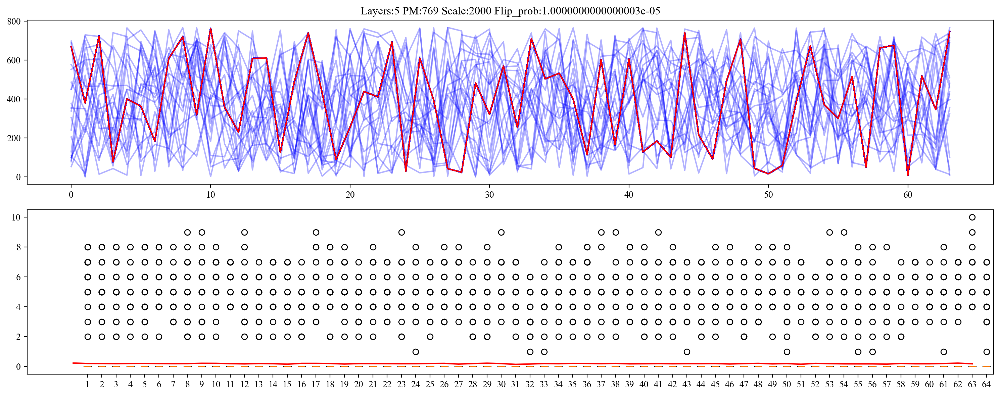

(array([[670, 380, 724, ..., 519, 347, 746],
        [670, 380, 724, ..., 519, 347, 746],
        [670, 380, 724, ..., 519, 347, 746],
        ...,
        [670, 380, 724, ..., 519, 347, 746],
        [670, 380, 724, ..., 519, 347, 746],
        [670, 380, 724, ..., 519, 347, 746]]),
 array([670, 380, 724,  77, 401, 363, 184, 609, 720, 319, 763, 358, 230,
        609, 611, 126, 488, 740, 432,  89, 256, 439, 411, 694,  29, 610,
        394,  42,  24, 483, 322, 570, 254, 710, 504, 533, 401, 114, 603,
        165, 606, 128, 185, 101, 742, 216,  92, 495, 708,  44,  16,  59,
        388, 673, 372, 301, 516,  50, 663, 677,   8, 519, 347, 746]))

In [117]:
test_multi_layers_ham(5, 257, 2000, 0.1**5)
test_multi_layers_ham(5, 769, 2000, 0.1**5)